In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import os

In [2]:
from subprocess import check_output
from wordcloud import WordCloud, STOPWORDS

In [3]:
import json

In [4]:
from matplotlib import ticker
from matplotlib.ticker import MultipleLocator
import matplotlib.colors as mc

motivation:
patterns
what the services and products are they need at least hope to have

# data collection

In [83]:
df = pd.read_csv("USvideos.csv")
df.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John..."
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...


In [6]:
df.info() # check the data types for later use


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40949 entries, 0 to 40948
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   video_id                40949 non-null  object
 1   trending_date           40949 non-null  object
 2   title                   40949 non-null  object
 3   channel_title           40949 non-null  object
 4   category_id             40949 non-null  int64 
 5   publish_time            40949 non-null  object
 6   tags                    40949 non-null  object
 7   views                   40949 non-null  int64 
 8   likes                   40949 non-null  int64 
 9   dislikes                40949 non-null  int64 
 10  comment_count           40949 non-null  int64 
 11  thumbnail_link          40949 non-null  object
 12  comments_disabled       40949 non-null  bool  
 13  ratings_disabled        40949 non-null  bool  
 14  video_error_or_removed  40949 non-null  bool  
 15  de

In [7]:
pd.options.display.float_format = '{:,.1f}'.format
df.describe()

,category_id,views,likes,dislikes,comment_count
count,"40,949.0","40,949.0","40,949.0","40,949.0","40,949.0"
mean,20.0,"2,360,784.6","74,266.7","3,711.4","8,446.8"
std,7.6,"7,394,113.8","228,885.3","29,029.7","37,430.5"
min,1.0,549.0,0.0,0.0,0.0
25%,17.0,"242,329.0","5,424.0",202.0,614.0
50%,24.0,"681,861.0","18,091.0",631.0,"1,856.0"
75%,25.0,"1,823,157.0","55,417.0","1,938.0","5,755.0"
max,43.0,"225,211,923.0","5,613,827.0","1,674,420.0","1,361,580.0"


In [8]:
df

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John..."
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40944,BZt0qjTWNhw,18.14.06,The Cat Who Caught the Laser,AaronsAnimals,15,2018-05-18T13:00:04.000Z,"aarons animals|""aarons""|""animals""|""cat""|""cats""...",1685609,38160,1385,2657,https://i.ytimg.com/vi/BZt0qjTWNhw/default.jpg,False,False,False,The Cat Who Caught the Laser - Aaron's Animals
40945,1h7KV2sjUWY,18.14.06,True Facts : Ant Mutualism,zefrank1,22,2018-05-18T01:00:06.000Z,[none],1064798,60008,382,3936,https://i.ytimg.com/vi/1h7KV2sjUWY/default.jpg,False,False,False,NaN
40946,D6Oy4LfoqsU,18.14.06,I GAVE SAFIYA NYGAARD A PERFECT HAIR MAKEOVER ...,Brad Mondo,24,2018-05-18T17:34:22.000Z,I gave safiya nygaard a perfect hair makeover ...,1066451,48068,1032,3992,https://i.ytimg.com/vi/D6Oy4LfoqsU/default.jpg,False,False,False,I had so much fun transforming Safiyas hair in...
40947,oV0zkMe1K8s,18.14.06,How Black Panther Should Have Ended,How It Should Have Ended,1,2018-05-17T17:00:04.000Z,"Black Panther|""HISHE""|""Marvel""|""Infinity War""|...",5660813,192957,2846,13088,https://i.ytimg.com/vi/oV0zkMe1K8s/default.jpg,False,False,False,How Black Panther Should Have EndedWatch More ...


# views, likes dislikes and comment counts have a normal distribution?

In [9]:
indicators=['views','likes','dislikes','comment_count']

In [10]:
bins=np.arange(0, 220e6, 10e6)-0.5
bins

array([-5.00000000e-01,  9.99999950e+06,  1.99999995e+07,  2.99999995e+07,
        3.99999995e+07,  4.99999995e+07,  5.99999995e+07,  6.99999995e+07,
        7.99999995e+07,  8.99999995e+07,  9.99999995e+07,  1.10000000e+08,
        1.20000000e+08,  1.30000000e+08,  1.40000000e+08,  1.50000000e+08,
        1.60000000e+08,  1.70000000e+08,  1.80000000e+08,  1.90000000e+08,
        2.00000000e+08,  2.10000000e+08])

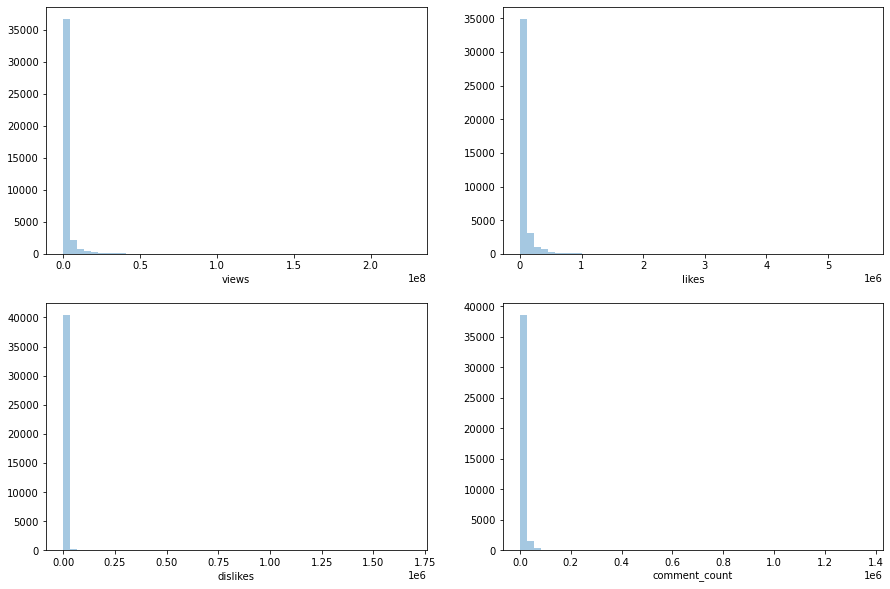

In [11]:
fig, ((ax1, ax2),(ax3, ax4)) = plt.subplots(2,2,figsize=(15,10))

for i, axs in enumerate([[ax1, ax2], [ax3, ax4]]):
    for j, ax in enumerate(axs):
        sns.distplot(df[indicators[i+j+i]], ax=ax, kde=False)

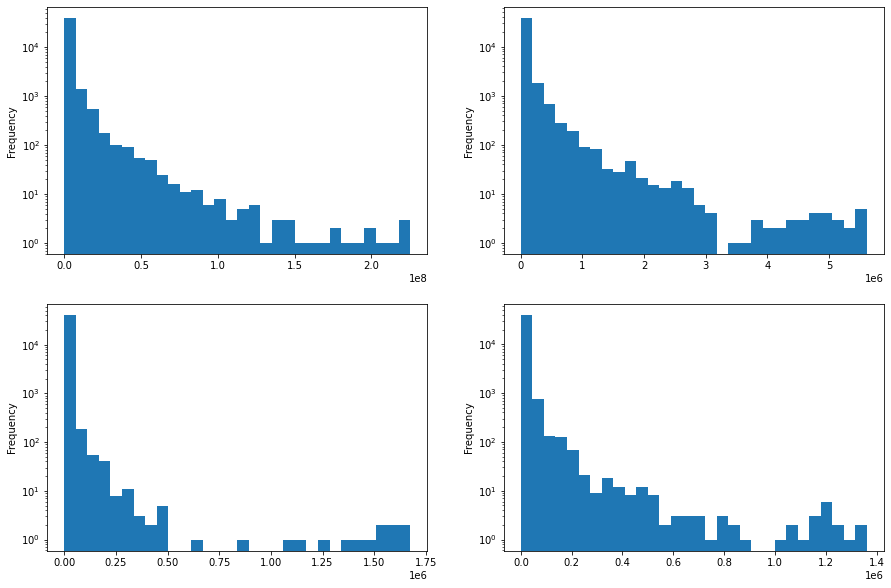

In [12]:
fig, ((ax1, ax2),(ax3, ax4)) = plt.subplots(2,2,figsize=(15,10))

for i, axs in enumerate([[ax1, ax2], [ax3, ax4]]):
    for j, ax in enumerate(axs):
        df[indicators[i+j+i]].plot(logy=True, kind='hist',bins=30, ax=ax)

In [13]:
df_log =pd.DataFrame({'likes_log': np.log(df['likes'] + 1),
              'views_log': np.log(df['views'] + 1),
              'dislikes_log': np.log(df['dislikes'] + 1),
              'comment_count_log': np.log(df['comment_count'] + 1)})
df_log

,likes_log,views_log,dislikes_log,comment_count_log
0,11.0,13.5,8.0,9.7
1,11.5,14.7,8.7,9.4
2,11.9,15.0,8.6,9.0
3,9.2,12.7,6.5,7.7
4,11.8,14.6,7.6,9.8
...,...,...,...,...
40944,10.5,14.3,7.2,7.9
40945,11.0,13.9,5.9,8.3
40946,10.8,13.9,6.9,8.3
40947,12.2,15.5,8.0,9.5


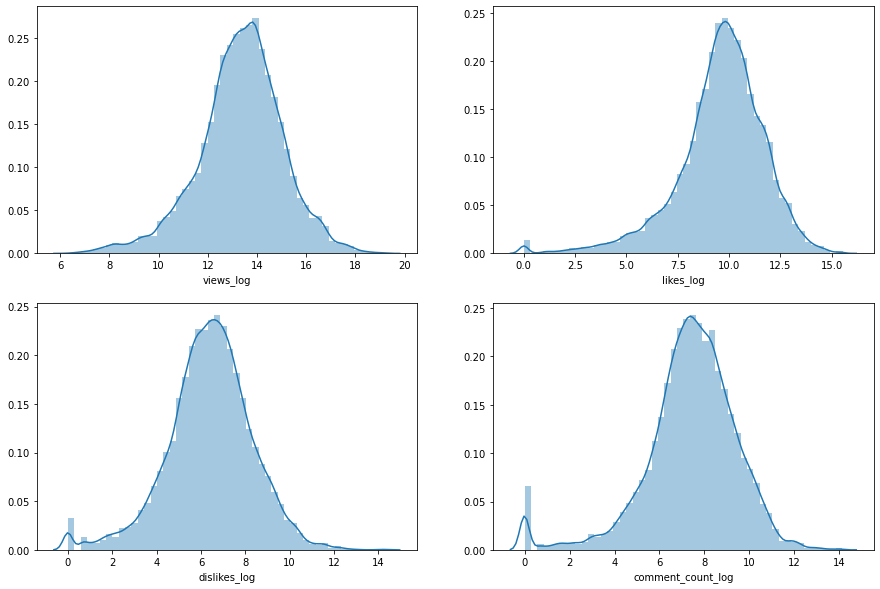

In [14]:
fig, ((ax1, ax2),(ax3, ax4)) = plt.subplots(2,2,figsize=(15,10))

for i, axs in enumerate([[ax1, ax2], [ax3, ax4]]):
    for j, ax in enumerate(axs):
        sns.distplot(df_log[indicators[i+j+i]+'_log'], ax=ax)
        

In [15]:
import plotly.figure_factory as ff
import plotly.offline as py

In [16]:
# Add histogram data
x1 = np.random.randn(200) - 2
x2 = np.random.randn(200)
x3 = np.random.randn(200) + 2
x4 = np.random.randn(200) + 4

# Group data together
hist_data = [x1, x2, x3, x4]

group_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=.2)
fig.show()

In [17]:
hist_data = [df_log["views_log"], df_log["likes_log"], df_log["dislikes_log"],df_log["comment_count_log"]]

group_labels = ['views', 'likes log distribution', 'disLikes log distribution', 'comment']

fig = ff.create_distplot(hist_data, group_labels,
                         bin_size=0.2, show_rug=False)
fig.show()


In [18]:
df.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John..."
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...


# channels with most numbers of trending videos

In [19]:

ch = df.groupby('channel_title')['channel_title'].count().sort_values(ascending=False).reset_index(name='count')

pd.set_option('display.max_rows', ch.shape[0]+1)
ch.head()

,channel_title,count
0,ESPN,203
1,The Tonight Show Starring Jimmy Fallon,197
2,Vox,193
3,TheEllenShow,193
4,Netflix,193


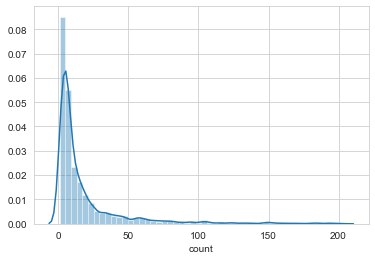

In [63]:
sns.distplot(ch['count'])

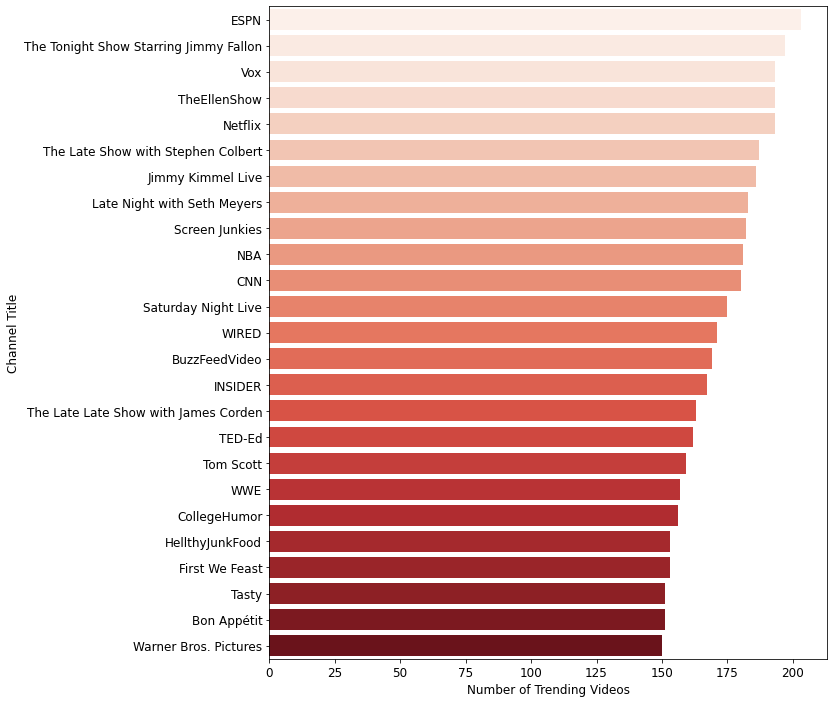

In [21]:
fig, ax = plt.subplots(figsize=(10,12))
sns.barplot(data=ch.head(25), x='count', y='channel_title', 
            palette=sns.color_palette("Reds", n_colors=25), ax=ax)
ax.tick_params(axis='both',which='major',labelsize=12)
#ax.set(xlabel="No. of videos", ylabel="Channel")
ax.set_ylabel('Channel Title', fontsize=12)
ax.set_xlabel('Number of Trending Videos', fontsize=12)
plt.show()

 add the category names

In [22]:
with open("US_category_id.json") as f:
    categories = json.load(f)["items"]
ct_dict = {}
for ct in categories:
    ct_dict[int(ct["id"])] = ct["snippet"]["title"]
df['category_name']=df['category_id'].map(ct_dict)

In [64]:
df.head(2)

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_name,time,publishing_day,publishing_hour
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13 17:13:01+00:00,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,People & Blogs,2017-11-13 17:13:01+00:00,Monday,17
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13 07:30:00+00:00,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",Entertainment,2017-11-13 07:30:00+00:00,Monday,7


# video category largest number

In [84]:
ct = df.groupby('category_name')['category_name'].count().sort_values(ascending=False).reset_index(name='count')
ct

KeyError: 'category_name'

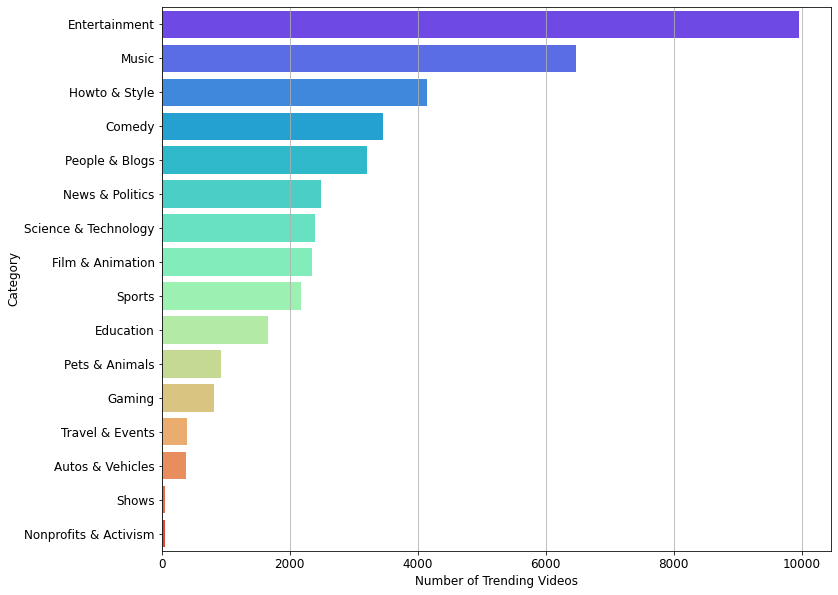

In [25]:
fig, ax = plt.subplots(figsize=(12,10))
sns.barplot(data=ct.head(20), x='count', y='category_name', 
            palette=sns.color_palette("rainbow", n_colors=16), ax=ax)
ax.tick_params(axis='both',which='major',labelsize=12)
#ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
ax.set_ylabel('Category', fontsize=12)
ax.set_xlabel('Number of Trending Videos', fontsize=12)
ax.xaxis.grid(True)
plt.show()

# category most likes

In [82]:
df2 = df.groupby(['channel_title'])[['likes']].sum().sort_values(by='likes',ascending=False)
df2

,likes
channel_title,
ibighit,199247121
ChildishGambinoVEVO,96700818
Dude Perfect,60275557
Marvel Entertainment,55873344
ArianaGrandeVevo,52170970
jypentertainment,44900910
TaylorSwiftVEVO,39292840
Ed Sheeran,39279211
ZaynVEVO,31695245


In [77]:
df3 = df.groupby(['category_name'])[['views']].sum().sort_values(by='views',ascending=False)
df3

,views
category_name,
Music,40132892190
Entertainment,20604388195
Film & Animation,7284156721
Comedy,5117426208
People & Blogs,4917191726
Sports,4404456673
Howto & Style,4078545064
Science & Technology,3487756816
Gaming,2141218625


There is a strong positive correlation between the number of views and the number of likes of trending videos: As one of them increases, the other increases, and vice versa.

There is a strong positive correlation also between the number of likes and the number of comments, and a slightly weaker one between the number of dislikes and the number of comments.

# Correlation

In [27]:
corr = df.select_dtypes(include=['number', 'bool']).drop(columns=['category_id', 'video_error_or_removed'])
corr.head(2)

,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled
0,748374,57527,2966,15954,False,False
1,2418783,97185,6146,12703,False,False


In [28]:
pd.options.display.float_format = '{:,.3f}'.format
corr.corr()

,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled
views,1.000,0.849,0.472,0.618,0.003,0.015
likes,0.849,1.000,0.447,0.803,-0.029,-0.021
dislikes,0.472,0.447,1.000,0.700,-0.004,-0.008
comment_count,0.618,0.803,0.700,1.000,-0.028,-0.014
comments_disabled,0.003,-0.029,-0.004,-0.028,1.000,0.319
ratings_disabled,0.015,-0.021,-0.008,-0.014,0.319,1.000


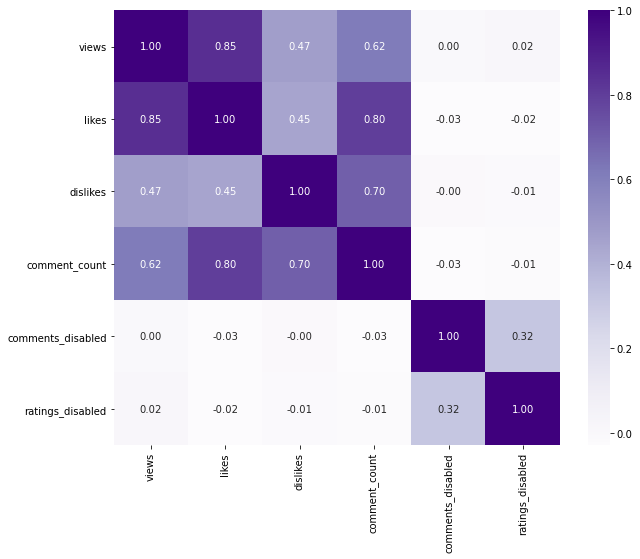

In [29]:
# heat map
fig, ax = plt.subplots(figsize=(10,8))
sns.heatmap(corr.corr(), fmt=".2f", annot=True, cmap='Purples', ax=ax)
plt.show()

# only need to see a triangle region, it's symmetry
# dislikes more tend to express emtion, give comments
# strong/high correlation
# moderate/medium correlation
# weak correlation

In [30]:
corr2 = corr.select_dtypes(include=['number'])
corr2

,views,likes,dislikes,comment_count
0,748374,57527,2966,15954
1,2418783,97185,6146,12703
2,3191434,146033,5339,8181
3,343168,10172,666,2146
4,2095731,132235,1989,17518
...,...,...,...,...
40944,1685609,38160,1385,2657
40945,1064798,60008,382,3936
40946,1066451,48068,1032,3992
40947,5660813,192957,2846,13088


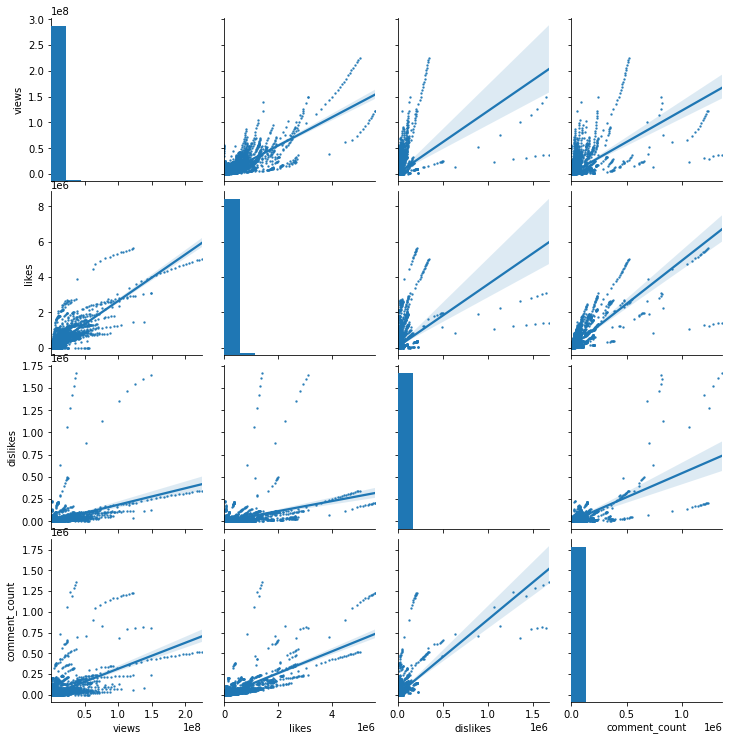

In [31]:
g = sns.pairplot(corr2, kind="reg", plot_kws = dict(scatter_kws=dict(s=2)))

In [32]:
us_videos_first = df.drop_duplicates(subset=['video_id'], keep='first', inplace=False)

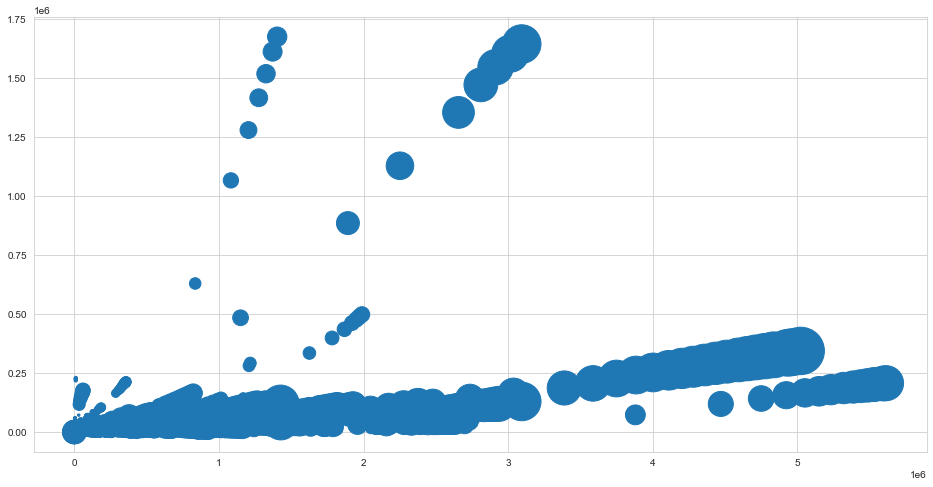

In [33]:
plt.figure(figsize=(16,8))
sns.set_style("whitegrid")

plt.scatter(df['likes'].values,df['dislikes'].values, s=df['views'].values/100000)

#  Sentiment Analysis with Tags


In [34]:
pip install nltk

Note: you may need to restart the kernel to use updated packages.


In [35]:
# Sentiment analysis on Video's tags

from wordcloud import WordCloud
from wordcloud import WordCloud, STOPWORDS

from collections import Counter

In [36]:
import nltk

from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk import sent_tokenize, word_tokenize
from nltk.tokenize import RegexpTokenizer

import re

In [37]:
#nltk

In [38]:
#nltk.download()

showing info https://raw.githubusercontent.com/nltk/nltk_data/gh-pages/index.xml


True

In [39]:
MAX_N = 1000

#remove all the stopwords from the text
en_stopwords = list(stopwords.words('english'))  
#en_stopwords.extend(de_stopwords)
#en_stopwords.extend(fr_stopwords)

In [40]:
ct_names = list(ct_dict.values())
ct_names[1:5]

['Autos & Vehicles', 'Music', 'Pets & Animals', 'Sports']

In [41]:
df['tags'].loc[10]

'NFL|"Football"|"offense"|"defense"|"afc"|"nfc"|"American Football"|"highlight"|"highlights"|"game"|"games"|"sport"|"sports"|"action"|"play"|"plays"|"season"|"2017"|"rookie"|"rookies"|"recap"|"run"|"sprint"|"catch"|"huge"|"amazing"|"touchdown"|"td"|"week 9"|"wk 9"|"new england"|"patriots"|"pats"|"denver"|"broncos"|"lewis"|"kickoff"|"kick return"|"return td"|"special teams"|"sp:dt=2017-11-12T20:30:00-05:00"|"sp:vl=en-US"|"sp:st=football"|"sp:li=nfl"|"sp:ti:home=Den"|"sp:ti:away=NE"|"sp:scp=athlete_in_match"|"sp:ty=high"|"nfl-lewdio"'

In [42]:
polarities = list()

for names in ct_names:
    tags = df[df['category_name']==names]['tags'].str.lower().str.cat(sep=' ')

    # removes punctuation, numbers and returns list of words
    tags = re.sub('[^A-Za-z]+', ' ', tags)
    word_tokens = word_tokenize(tags)
    filtered_sentence = [w for w in word_tokens if not w in en_stopwords]
    without_single_chr = [word for word in filtered_sentence if len(word) > 2]

    # removes punctuation,numbers and returns list of words
    tags = re.sub('[^A-Za-z]+', ' ', tags)
    word_tokens = word_tokenize(tags)
    filtered_sentence = [w for w in word_tokens if not w in en_stopwords]
    without_single_chr = [word for word in filtered_sentence if len(word) > 2]

    # Remove numbers
    cleaned_data_title = [word for word in without_single_chr if not word.isdigit()]      
    
    # Calculate frequency distribution
    word_dist = nltk.FreqDist(cleaned_data_title)
    hnhk = pd.DataFrame(word_dist.most_common(MAX_N),
                    columns=['Word', 'Frequency'])

    compound = .0
    for word in hnhk['Word'].head(MAX_N):
        compound += SentimentIntensityAnalyzer().polarity_scores(word)['compound']

    polarities.append(compound)
    

KeyboardInterrupt: 

In [ ]:

category_list = pd.DataFrame(category_list)
polarities = pd.DataFrame(polarities)
tags_sentiment = pd.concat([category_list,polarities],axis=1)
tags_sentiment.columns = ['category','polarity']
tags_sentiment=tags_sentiment.sort_values('polarity').reset_index()

plt.figure(figsize=(16,10))
sns.set(style="white",context="talk")
ax = sns.barplot(x=tags_sentiment['polarity'],y=tags_sentiment['category'], data=tags_sentiment,orient='h',palette="RdBu")
plt.xlabel("Categories")
plt.ylabel("polarity")
plt.title("Polarity of Categories in Youtube videos")

In [ ]:
def wcloud(data,bgcolor):
    plt.figure(figsize = (20,15))
    cloud = WordCloud(background_color = bgcolor, max_words = 100,  max_font_size = 50)
    cloud.generate(' '.join(data))
    plt.imshow(cloud)
    plt.axis('off')

# Sentiment Analysis 

# publish time

In [43]:
tmp = df['publish_time'].copy()
df['time'] = pd.to_datetime(df['publish_time'])

In [44]:
tmp

0        2017-11-13T17:13:01.000Z
1        2017-11-13T07:30:00.000Z
2        2017-11-12T19:05:24.000Z
3        2017-11-13T11:00:04.000Z
4        2017-11-12T18:01:41.000Z
                   ...           
40944    2018-05-18T13:00:04.000Z
40945    2018-05-18T01:00:06.000Z
40946    2018-05-18T17:34:22.000Z
40947    2018-05-17T17:00:04.000Z
40948    2018-05-17T17:09:38.000Z
Name: publish_time, Length: 40949, dtype: object

In [45]:
tmp2 = df[['publish_time']]
tmp2

,publish_time
0,2017-11-13T17:13:01.000Z
1,2017-11-13T07:30:00.000Z
2,2017-11-12T19:05:24.000Z
3,2017-11-13T11:00:04.000Z
4,2017-11-12T18:01:41.000Z
...,...
40944,2018-05-18T13:00:04.000Z
40945,2018-05-18T01:00:06.000Z
40946,2018-05-18T17:34:22.000Z
40947,2018-05-17T17:00:04.000Z


In [46]:
tmp2 = pd.to_datetime(df['publish_time'])
tmp2

0       2017-11-13 17:13:01+00:00
1       2017-11-13 07:30:00+00:00
2       2017-11-12 19:05:24+00:00
3       2017-11-13 11:00:04+00:00
4       2017-11-12 18:01:41+00:00
                   ...           
40944   2018-05-18 13:00:04+00:00
40945   2018-05-18 01:00:06+00:00
40946   2018-05-18 17:34:22+00:00
40947   2018-05-17 17:00:04+00:00
40948   2018-05-17 17:09:38+00:00
Name: publish_time, Length: 40949, dtype: datetime64[ns, UTC]

In [47]:
tmp2["publishing_hour"] = tmp2.dt.hour

In [48]:
df['time']

0       2017-11-13 17:13:01+00:00
1       2017-11-13 07:30:00+00:00
2       2017-11-12 19:05:24+00:00
3       2017-11-13 11:00:04+00:00
4       2017-11-12 18:01:41+00:00
                   ...           
40944   2018-05-18 13:00:04+00:00
40945   2018-05-18 01:00:06+00:00
40946   2018-05-18 17:34:22+00:00
40947   2018-05-17 17:00:04+00:00
40948   2018-05-17 17:09:38+00:00
Name: time, Length: 40949, dtype: datetime64[ns, UTC]

KeyError: 'publishing_hour'

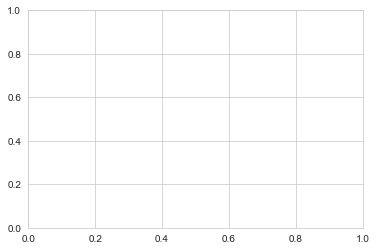

In [49]:
fig, ax = plt.subplots()

ax = df['publishing_hour'].value_counts().sort_index().plot(
    kind='bar', figsize=(14,8), rot=0, color=THEME_COL)

ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

plot_conf(ax, xlbl='Hour', ylbl='Number of videos', ticklbl_size=11, lbl_size=12)
# change_width(ax, .3)
plt.tight_layout()
plt.savefig('/Users/ammar/Documents/Projects/personal_website/_drafts/yta2-pophours.png', dpi=300)

In [50]:
tmp_publishedAt = df['publish_time'].copy()
df['publish_time'] = pd.to_datetime(df['publish_time'])

In [51]:
df["publishing_day"] = df["publish_time"].dt.day_name()
df["publishing_hour"] = df["publish_time"].dt.hour

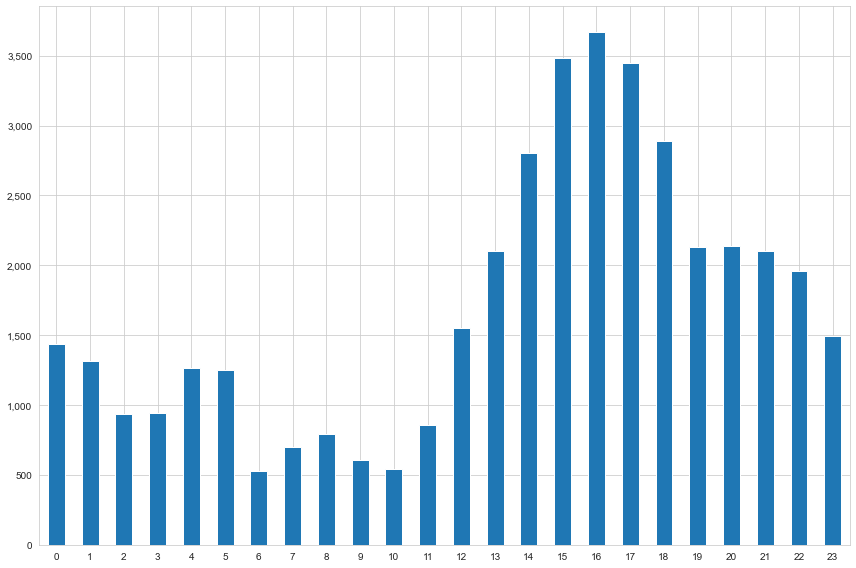

In [52]:
ax = df['publishing_hour'].value_counts().sort_index().plot(
    kind='bar', figsize=(12,8), rot=0)

ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

#plot_conf(ax, xlbl='Hour', ylbl='Number of videos', ticklbl_size=11, lbl_size=12)
# change_width(ax, .3)
plt.tight_layout()


# most common words

In [53]:
from sklearn.feature_extraction.text import CountVectorizer

In [54]:
count_vectorizer = CountVectorizer()
count_matrix = count_vectorizer.fit_transform(df['title']).todense()
map_index_to_word = {i: x for i, x in enumerate(count_vectorizer.get_feature_names())}


In [ ]:
# initialize dataframe
df_words = pd.DataFrame()
df_words = pd.concat([df_words, pd.DataFrame(count_matrix)], axis = 0)

# name columns
df_words.columns = map_index_to_word.values()

# compute sum of frequencies for each word
df_words.loc['total'] = df_words.select_dtypes(pd.np.number).sum()

# sort based on sum
df_sorted = df_words.sort_values(by = 'total', axis = 1, ascending = False)

In [ ]:
from nltk.corpus import stopwords
df_sorted = df_sorted.loc[:, ~df_sorted.columns.isin(stopwords.words('english'))]

In [ ]:
word_sort = df_sorted.transpose()[['total']]
word_sort

In [ ]:
fig, ax = plt.subplots(figsize=(20,8))
ax = word_sorted.plot.barh()
#ax.legend(bbox_to_anchor=(1.2, 0.6), fontsize='15')
plt.show()

# 4 Overall Conclusion and Extrapolating Prediction

__The economic power has a big impact on the decision of increasing, keeping or decreasing of the military spending.__

- __The user interactions roughly follow log normal distributions,\
 and they have some strong correlations__  
  
- __The favorite videos are about entertainments, music and sports__

# References

Analysis of YouTube Trending Videos of 2019 (US)\
https://github.com/ammar1y/YouTube-Trending-Videos-Analysis-2019/blob/master/YT-trending-analysis-2019-US.ipynb

YouTube Trending Videos Analysis (More Than 40,000 Videos)\
https://www.kaggle.com/ammar111/youtube-trending-videos-analysis

YouTube Data Exploration and Plotly Visualization\
https://kaggle.com/skalskip/youtube-data-exploration-and-plotly-visualization